In [1]:
import os
import numpy as np
import pandas as pd
from geolife_parser import *
from geolife_data import GeoLifeData, upsample_df

# ConvexHull
from scipy.spatial import ConvexHull

# Utils
from geospatial_utils import filter_region_trips

import plotting_wrapper as Plotting
import matplotlib.pyplot as plt
gmaps_api_key = "<Google Maps KEY>"

# Bokeh Google Maps
from bokeh.io import output_file, show, output_notebook, save, export_png
from bokeh.models import ColumnDataSource, GMapOptions
from bokeh.plotting import gmap
# output_notebook()

%matplotlib inline
%load_ext autoreload
%autoreload 2

Loading BokehJS ...

In [2]:
def get_spaced_colors(n):
    # Ref: https://www.quora.com/How-do-I-generate-n-visually-distinct-RGB-colours-in-Python
    max_value = 16581375 #255**3
    interval = int(max_value / n)
    colors = [hex(I)[2:].zfill(6) for I in range(0, max_value, interval)]
    
    return [(int(i[:2], 16), int(i[2:4], 16), int(i[4:], 16)) for i in colors]

def get_trip_states(data, resample=True, resample_rate='S', min_samples=10, max_samples=10000):
    
    trip_ids = []
    trip_states = []
    trip_dfs = []
    
    print("Resampling at rate {}".format(resample_rate))
    for trip_id, df_trip in data.groupby(["trip_id"]):
        
        if resample:
            df_trip.drop_duplicates(subset=["time"],keep="last", inplace=True)
            df_trip  = upsample_df(df_trip.set_index(
                    "time"), ["lat", "lon"], resample_rate)
            df_trip.dropna(inplace=True)
        
        s_seq = np.vstack((df_trip.lat.values, df_trip.lon.values)).transpose(1,0)
        
        if len(s_seq) < min_samples or len(s_seq) > max_samples:
            continue     
        # ConvexHull needs at least 3 points
        assert len(s_seq) >= 3, "min_samples must be >= 3"
        
        hull = ConvexHull(s_seq)
        distance = np.linalg.norm(s_seq[1:] - s_seq[0])
        time = len(s_seq)
       
        df_trip["Area"] = hull.area
        df_trip["Distance"] = distance
        df_trip["Time"] = time
        
        trip_dfs.append(df_trip)
        trip_ids.append(trip_id)
        trip_states.append(s_seq)
        
    return trip_ids, trip_states, trip_dfs

def df_list_to_traj_list(df_trip_list, zero_center=True, normalize_scale=False):
    
    traj_list = []
    for df_trip in df_trip_list:
        
        s_seq = np.vstack((df_trip.lat.values, df_trip.lon.values)).transpose(1,0)
        s_seq = np.asarray(s_seq)
        if zero_center:
            
            if normalize_scale:
                l1_max = np.max(np.max(np.abs(s_seq - s_seq[0])), 1e-12)
                traj_list.append((s_seq - s_seq[0]) / l1_max)
            else:
                traj_list.append((s_seq - s_seq[0]))
        else:
            # no change
            traj_list.append(s_seq)
            
    return traj_list

def plot_2d_state_seq(s_seq, show_cnvx_hull=True):
    
    if show_cnvx_hull:
        hull = ConvexHull(s_seq)
        for simplex in hull.simplices:
            plt.plot(s_seq[simplex, 0], s_seq[simplex, 1], 'k-')
        plt.plot(s_seq[:,0], s_seq[:,1])
        return hull.simplices, hull.area
    else:
        plt.plot(s_seq[:,0], s_seq[:,1])
        return None, None
            
def plot_2d_angular_vel(thetas):
    plt.plot(thetas)

def plot_trips(traj_list, show_cnvx_hull=False):
    simplices_list, area_list = [], []
    for s_seq in traj_list:
        simplices, area = plot_2d_state_seq(s_seq, show_cnvx_hull)
        simplices_list.append(simplices)
        area_list.append(area)
    return simplices_list, area_list
        
def angular_velocity(traj, angle_fn=np.arctan2):
    
    thetas = []
    for i in range(1,len(traj)):
        thetas.append(angle_fn(*(traj[i]-traj[i-1])))
    return thetas

def plot_2d_state_seq_and_angular_velocity(s_seq, angle_fn=np.arctan2, plot_rows=1, plot_cols=2, plot_idx=0, traj_idx=None, resample_rate='S'):
    
    distance = np.linalg.norm(s_seq[1:] - s_seq[0])
    time = len(s_seq)
    plt.subplot(plot_rows, plot_cols, plot_idx+1)
    simplices, area = plot_2d_state_seq(s_seq)
    plt.title("Trajectory {}: Dist={:.2f}, Time: {:.1f} {}\nPoints={}, Area={:.4f}".format(
        traj_idx, distance, time, resample_rate, len(s_seq), area))
    plt.subplot(plot_rows, plot_cols, plot_idx+2)
    plt.title("Angular Velocity")
    plot_2d_angular_vel(angular_velocity(s_seq, angle_fn))

In [3]:
car_data = pd.read_csv('./geolife_car_trips.csv', index_col=0, parse_dates=[1], infer_datetime_format=True)

In [4]:
data_cropped, box = filter_region_trips(car_data, "Beijing", 10, 10, lat_col="lat", lng_col="lon")
data = data_cropped
n_trips = data.trip_id.nunique()
n_trips
data.head()

Trips cropped: 50/726


,time,lat,lon,alt,trip_id,transport_mode,user_id
2679,2008-09-20 13:03:29,39.922800,116.304895,0.0,06820080920074701#4.0,car,68
2680,2008-09-20 13:03:31,39.923223,116.304958,0.0,06820080920074701#4.0,car,68
2681,2008-09-20 13:03:33,39.923573,116.304975,0.0,06820080920074701#4.0,car,68
2682,2008-09-20 13:03:35,39.923881,116.304972,0.0,06820080920074701#4.0,car,68
2683,2008-09-20 13:03:37,39.924137,116.304954,0.0,06820080920074701#4.0,car,68


In [5]:
# colors = get_spaced_colors(n_trips)
# p = None
# for i, (_, df) in enumerate(data.groupby(["trip_id"])):
    
#     p = Plotting.visualize_trajectory(
#         df["lat"], df["lon"], None, key=gmaps_api_key,
#         render=True if i == n_trips-1 else False, file=None,
#         plot_endpt=False, zoom=12,
#         draw_col=None, line_col=colors[i], line_width=2.0, fill_col="green", fill_alpha=1., dot_size=5,
#         show_grid_fn=None, p=p)

In [6]:
traj_ids, traj_list, traj_df_list = get_trip_states(data.copy(), resample_rate='S')
print("Trip summary: \n\tNo. of trips = {} \n\tTrip length: mean = {:.2f}, std = {:.2f}\n\tState dim: {}".format(
    len(traj_ids), 
    np.mean([len(t) for t in traj_list]), 
    np.std([len(t) for t in traj_list]),
    len(traj_list[0][0])))

Resampling at rate S


/Users/yrevar/.pyenv/versions/irl_python3/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Trip summary: 
	No. of trips = 47 
	Trip length: mean = 453.36, std = 547.81
	State dim: 2


In [7]:
traj_list = df_list_to_traj_list(traj_df_list)

Text(0.5,1,'GeoLife Car Trips (zero-centered)')

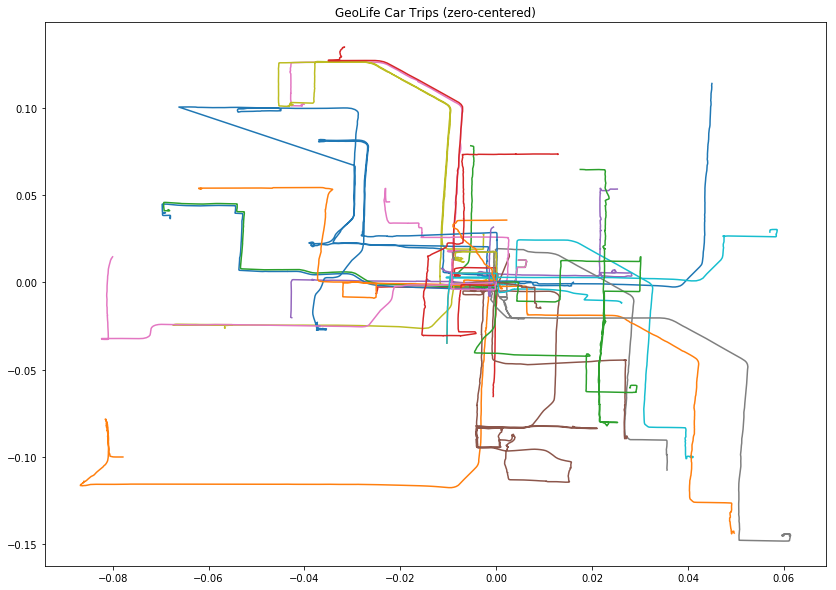

In [8]:
plt.figure(figsize=(14,10))
simplices_list, area_list = plot_trips(traj_list, show_cnvx_hull=False)
plt.title("GeoLife Car Trips (zero-centered)")

Text(0.5,1,'GeoLife Car Trips (zero-centered)')

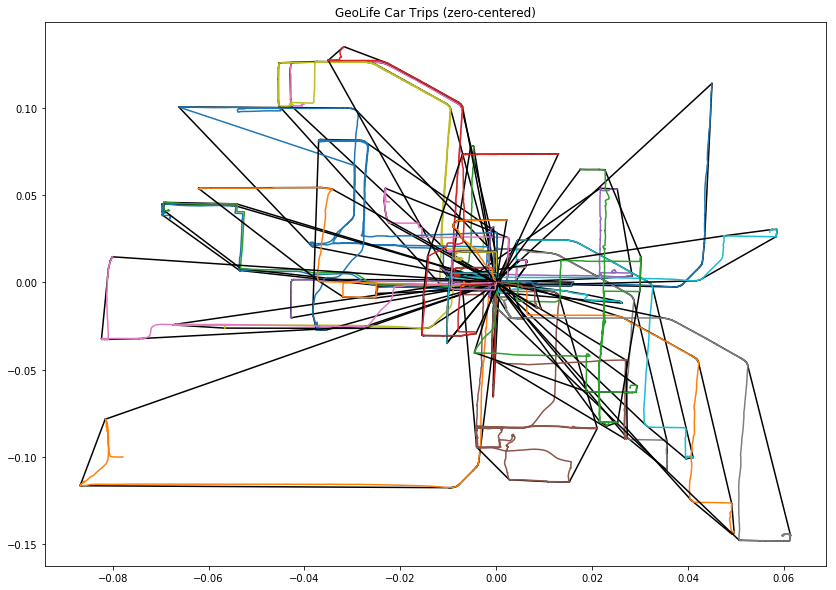

In [9]:
plt.figure(figsize=(14,10))
simplices_list, area_list = plot_trips(traj_list, show_cnvx_hull=True)
plt.title("GeoLife Car Trips (zero-centered)")

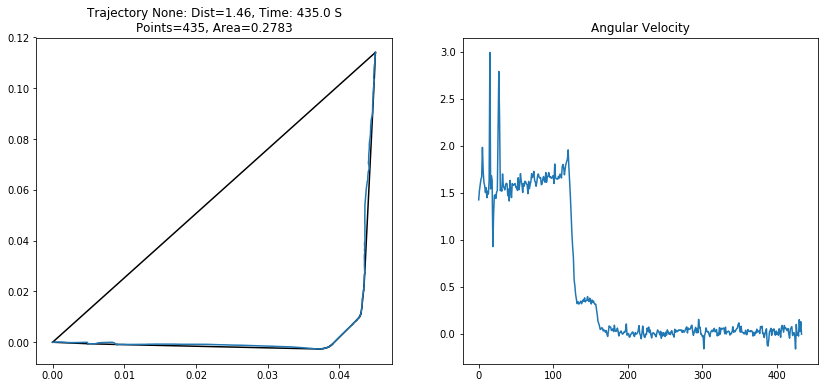

In [10]:
plt.figure(figsize=(14,6))
plot_2d_state_seq_and_angular_velocity(traj_list[0])

Text(0.5,0.95,'Geolife: Car Trajectories zero-centered (Odd columns). Context Hull (black). Angular Velocities(Even columns)')

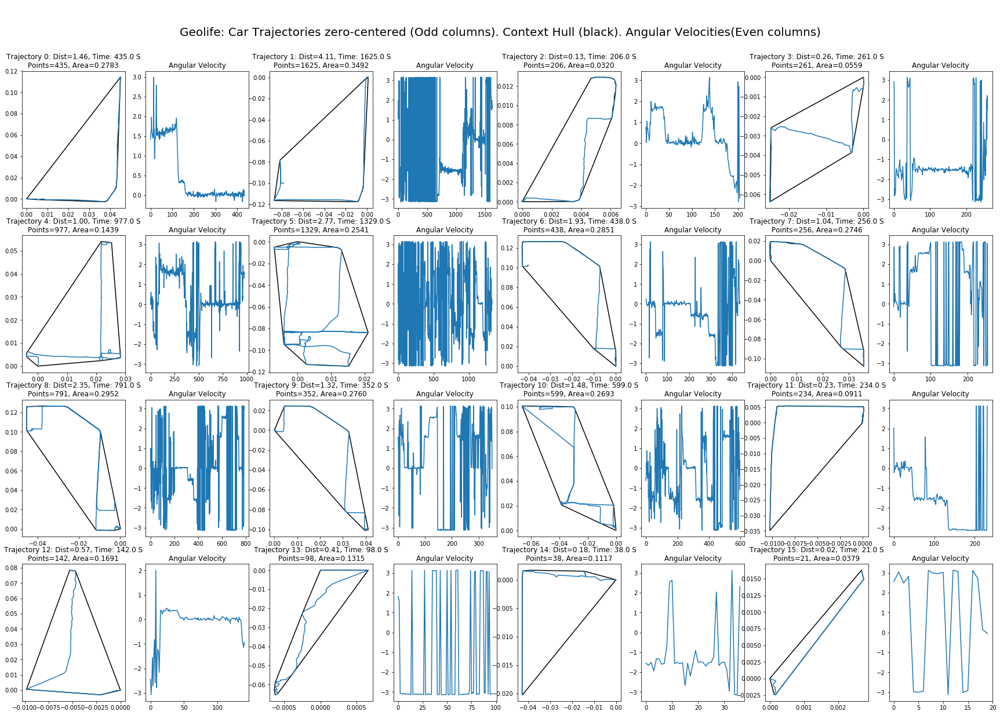

In [11]:
fig = plt.figure(figsize=(30,20))
for idx, traj in enumerate(traj_list[:16]):
    plot_2d_state_seq_and_angular_velocity(traj, plot_rows=4, plot_cols=8, plot_idx=idx*2, traj_idx=idx)
# plt.suptitle("Geolife: Car Trajectories zero-centered (Odd columns). Context Hull (black). Angular Velocities(Even columns)")
# plt.tight_layout()
fig.get_axes()[0].annotate("Geolife: Car Trajectories zero-centered (Odd columns). Context Hull (black). Angular Velocities(Even columns)", (0.5, 0.95), 
                            xycoords='figure fraction', ha='center', 
                            fontsize=20
                            )

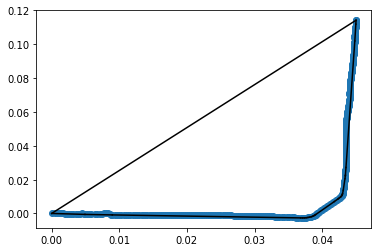

In [12]:
points = traj_list[0]
hull = ConvexHull(points)
plt.plot(points[:,0], points[:,1], 'o')
for simplex in hull.simplices:
    plt.plot(points[simplex, 0], points[simplex, 1], 'k-')

In [13]:
data_cropped, box = filter_region_trips(car_data, "Beijing", 50, 50, lat_col="lat", lng_col="lon")
data = data_cropped
n_trips = data.trip_id.nunique()
n_trips
data.head()

Trips cropped: 606/726


,time,lat,lon,alt,trip_id,transport_mode,user_id
0,2008-09-27 11:42:13,39.995196,116.327816,594.0,01020080927114213#4.0,car,10
1,2008-09-27 11:42:14,39.995223,116.327865,594.0,01020080927114213#4.0,car,10
2,2008-09-27 11:42:15,39.995258,116.327906,597.0,01020080927114213#4.0,car,10
3,2008-09-27 11:42:16,39.995293,116.327940,597.0,01020080927114213#4.0,car,10
4,2008-09-27 11:42:17,39.995334,116.327954,597.0,01020080927114213#4.0,car,10


In [14]:
_, _, trip_dfs = get_trip_states(data.copy(), resample=True, resample_rate='S')

Resampling at rate S


/Users/yrevar/.pyenv/versions/irl_python3/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [15]:
med_hull_area = np.median([df.Area[0] for df in trip_dfs])
mean_hull_area = np.mean([df.Area[0] for df in trip_dfs])
print("CnvxHull Area: median={}, mean={}".format(med_hull_area, mean_hull_area))

CnvxHull Area: median=0.26583924694819777, mean=0.3371950518686183


In [16]:
trip_dfs_small = []
area_list = {}
count = 0
for df in trip_dfs:
#     if df.Area[0] < med_hull_area:
    trip_dfs_small.append(df)
    area_list[df.trip_id[0]] = df.Area[0]
    count += 1
print("{} trips with below median area".format(count))

# assert ConvexHull(s_seq).area == ConvexHull(s_seq - s_seq[0]).area

601 trips with below median area


In [17]:
trip_dfs_small = sorted(trip_dfs_small, key=lambda x: area_list[x.trip_id[0]])
traj_list2 = df_list_to_traj_list(trip_dfs_small, zero_center=True)

Text(0.5,1,'GeoLife Car Trips 50x50 sq mile')

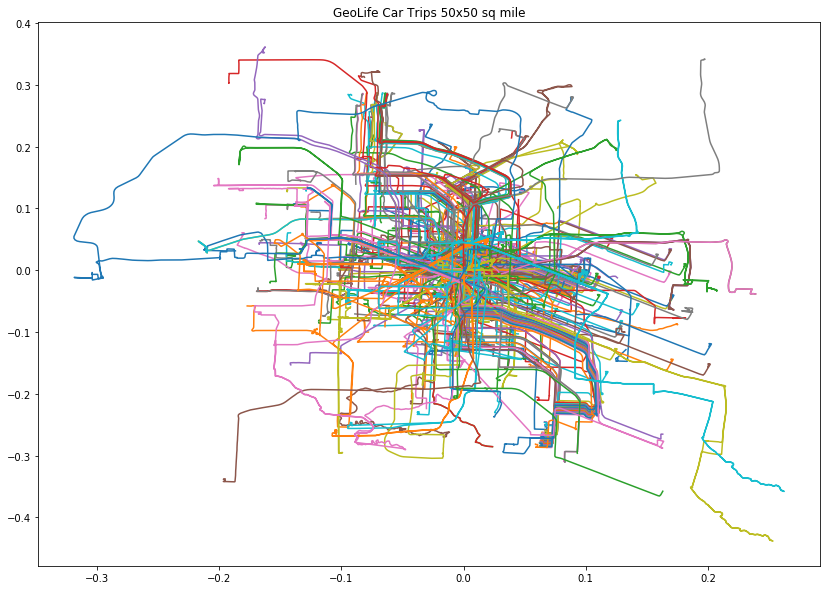

In [18]:
plt.figure(figsize=(14,10))
simplices_list, area_list = plot_trips(traj_list2, show_cnvx_hull=False)
plt.title("GeoLife Car Trips 50x50 sq mile".format(med_hull_area))

In [19]:
def plot_trips_incrementally(traj_list):
    plt.figure(figsize=(14,10))
    lat_min, lat_max = np.max([np.max(t[:,0]) for t in traj_list]), np.min([np.min(t[:,0]) for t in traj_list])
    lon_min, lon_max = np.max([np.max(t[:,1]) for t in traj_list]), np.min([np.min(t[:,1]) for t in traj_list])
    for i in range(0, len(traj_list), 10):
        simplices_list, area_list = plot_trips(traj_list[i:i+10], show_cnvx_hull=False)
        plt.title("GeoLife Car Trips 50x50 sq mile: sorted by conex hull area")
        plt.xlim([lat_min, lat_max])
        plt.ylim([lon_min, lon_max])
        yield read_pil_image_from_plt(plt)

In [20]:
import io
import imageio
from PIL import Image
from IPython import display
def read_pil_image_from_plt(plt):
    buf = io.BytesIO()
    plt.savefig(buf, format='png')
    buf.seek(0)
    return Image.open(buf)

def create_gif(img_generator, cmap=plt.cm.viridis, gif_name="./__gif_sample.gif", fps=10,
               figsize=(4, 4), title=None, display=False):
    with imageio.get_writer(gif_name, mode='I', fps=fps) as writer:
        for img in img_generator():
            # Append to GIF
            writer.append_data(np.array(img))
            
            # Wait to draw - only for online visualization
            if display:
                plt.imshow(img)
                display.clear_output(wait=True)
                display.display(plt.gcf())
        plt.clf()
    return

In [21]:
# create_gif(lambda: plot_trips_incrementally(traj_list2), gif_name="./__trips_increasing_hull_area.gif")

<img src="./__trips_increasing_hull_area.gif"/>

<img src="./__trips_increasing_hull_area__below_median.gif"/>

In [22]:
trip_dfs_area_sorted = sorted(trip_dfs, key=lambda x: x.Area[0])
traj_list = df_list_to_traj_list(trip_dfs_area_sorted, zero_center=False)

In [23]:
colors = get_spaced_colors(len(traj_list))
p = None
for i, traj_states in enumerate(traj_list):
    p = Plotting.visualize_trajectory(
        traj_states[:,0], traj_states[:,1], None, key=gmaps_api_key,
        render=True if i == len(traj_list)-1 else False, file=None,
        plot_endpt=False, zoom=12,
        draw_col=None, line_col=colors[i], line_width=2.0, fill_col="green", fill_alpha=1., dot_size=5,
        show_grid_fn=None, p=p)

In [24]:
idx = 4
p = Plotting.visualize_trajectory(
    traj_list[idx][:,0], traj_list[idx][:,1], None, key=gmaps_api_key,
    render=True, file=None,
    plot_endpt=True, zoom=16,
    draw_col=None, line_col=colors[i], line_width=2.0, fill_col="green", fill_alpha=1., dot_size=5,
    show_grid_fn=None, p=None)

In [25]:
# def trips_to_features(traj_states_list, pad):
    
#     for traj_states in traj_states_list:
        
#         diff_feature = traj_states[1:]-traj_states[:-1]